<a href="https://colab.research.google.com/github/Mty12/Analise_de_Dados_AIRBNB_JERSEY/blob/main/Analisando_os_Dados_do_Airbnb_de_Jersey.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img alt="Colaboratory logo" width="15%" src="https://raw.githubusercontent.com/carlosfab/escola-data-science/master/img/novo_logo_bg_claro.png">

#### **Data Science na Prática 3.0**
*by [sigmoidal.ai](https://sigmoidal.ai)*

---

# Análise dos Dados do Airbnb - *Jersey*

O [Airbnb](https://www.airbnb.com.br/) já é considerado como sendo a **maior empresa hoteleira da atualidade**. Ah, o detalhe é que ele **não possui nenhum hotel**!

Conectando pessoas que querem viajar (e se hospedar) com anfitriões que querem alugar seus imóveis de maneira prática, o Airbnb fornece uma plataforma inovadora para tornar essa hospedagem alternativa.

No final de 2018, a Startup fundada 10 anos atrás, já havia **hospedado mais de 300 milhões** de pessoas ao redor de todo o mundo, desafiando as redes hoteleiras tradicionais.

Uma das iniciativas do Airbnb é disponibilizar dados do site, para algumas das principais cidades do mundo. Por meio do portal [Inside Airbnb](http://insideairbnb.com/get-the-data.html), é possível baixar uma grande quantidade de dados para desenvolver projetos e soluções de *Data Science*.

<center><img alt="Analisando Airbnb" width="10%" src="https://www.area360.com.au/wp-content/uploads/2017/09/airbnb-logo.jpg"></center>

**Neste *notebook*, iremos analisar os dados referentes à cidade de Jersey, e ver quais insights podem ser extraídos a partir de dados brutos.**

## Obtenção dos Dados


In [ ]:
# importar os pacotes necessarios
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
%matplotlib inline
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip -q

In [ ]:
# importar o arquivo listings.csv para um DataFrame
df =pd.read_csv('http://data.insideairbnb.com/united-states/nj/jersey-city/2021-12-20/visualisations/listings.csv')

## Análise dos Dados


**Dicionário das variáveis**

id - número de id gerado para identificar o imóvel

name - nome da propriedade anunciada

host_id - número de id do proprietário (anfitrião) da propriedade

host_name - Nome do anfitrião

neighbourhood_group - esta coluna não contém nenhum valor válido

neighbourhood - nome do bairro

latitude - coordenada da latitude da propriedade

longitude - coordenada da longitude da propriedade

room_type - informa o tipo de quarto que é oferecido

price - preço para alugar o imóvel

minimum_nights - quantidade mínima de noites para reservar

number_of_reviews - número de reviews que a propriedade possui

last_review - data do último review

reviews_per_month - quantidade de reviews por mês

calculated_host_listings_count - quantidade de imóveis do mesmo anfitrião

availability_365 - número de dias de disponibilidade dentro de 365 dias

license - Licença para operação na cidade de Jersey


Antes de iniciar qualquer análise, vamos verificar a cara do nosso *dataset*, analisando as 5 primeiras entradas.

In [ ]:
# mostrar as 5 primeiras entradas
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,40669,Skyy’s Lounge / Cozy,175412,Skyy,NaN,Ward C (councilmember Richard Boggiano),40.73742,-74.05255,Private room,128,3,10,2019-10-12,0.07,2,74,0,NaN
1,215768,Minutes to Manhattan & Jersey Shore,846837,Charlaine,NaN,Ward F (councilmember Jermaine D. Robinson),40.71663,-74.05799,Entire home/apt,111,6,137,2021-11-22,1.10,1,353,12,STR20-00055
2,269266,Modern private 2 bedrooms apt minutes to NYC,1410590,Magda,NaN,Ward F (councilmember Jermaine D. Robinson),40.71266,-74.06329,Entire home/apt,109,2,380,2021-12-05,3.10,8,348,27,NaN
3,270245,Private room with own bathroom close to NYC,1410590,Magda,NaN,Ward F (councilmember Jermaine D. Robinson),40.71203,-74.06532,Private room,46,3,249,2021-12-06,2.04,8,292,28,NaN
4,271255,Large Room with private bathroom min to Manhattan,1410590,Magda,NaN,Ward F (councilmember Jermaine D. Robinson),40.71258,-74.06284,Private room,62,2,286,2021-12-05,2.43,8,347,29,NaN


### **Q1. Quantos atributos (variáveis) e quantas entradas o nosso conjunto de dados possui? Quais os tipos das variáveis?**

In [ ]:
# identificar o volume de dados do DataFrame
print("Entradas:\t {}".format(df.shape[0]))
print("Variáveis:\t {}\n".format(df.shape[1]))

# verificar as 5 primeiras entradas do dataset
df.dtypes

Entradas:	 1001
Variáveis:	 18



id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                            object
dtype: object

### **Q2. Qual a porcentagem de valores ausentes no *dataset*?**

"Trabalhar com um dataset com valores ausentes é um problema de grande relevância no momento da análise de dados, problema que pode ser fruto de diversos motivos, como falhas no sistema de coleta, clientes que se negam a responder, problemas de integração de diferentes fontes e etc"

Aqui verificamos que cerca de 95% das hospedagens do AIRBNB de Jersey não estão devidamente licenciados.
Vimos também que nenhum dado  do neighbourhood_group 


É possivel ver que cerca de 26% dos locatários não tem qualquer tipo de Review em seus estabelecimento.




In [ ]:
# ordenar em ordem decrescente as variáveis por seus valores ausentes
(df.isnull().sum() / df.shape[0]).sort_values(ascending=False)

neighbourhood_group               1.000000
license                           0.959041
reviews_per_month                 0.263736
last_review                       0.263736
minimum_nights                    0.000000
number_of_reviews_ltm             0.000000
availability_365                  0.000000
calculated_host_listings_count    0.000000
number_of_reviews                 0.000000
id                                0.000000
name                              0.000000
room_type                         0.000000
longitude                         0.000000
latitude                          0.000000
neighbourhood                     0.000000
host_name                         0.000000
host_id                           0.000000
price                             0.000000
dtype: float64

Aqui iremos limpar os dados faltantes, já que o número é relativamente alto (25%) ou até 100% de numero invalido. Dificultando assim de gerar uma analise de maior acurácia 

In [ ]:
df_clean = df.copy()
df_clean.drop(['neighbourhood_group', 'license', 'last_review', 'reviews_per_month'], axis = 1, inplace = True)
df_clean.isnull().sum()

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
calculated_host_listings_count    0
availability_365                  0
number_of_reviews_ltm             0
dtype: int64

### **Q3. Qual o tipo de distribuição das variáveis?** 

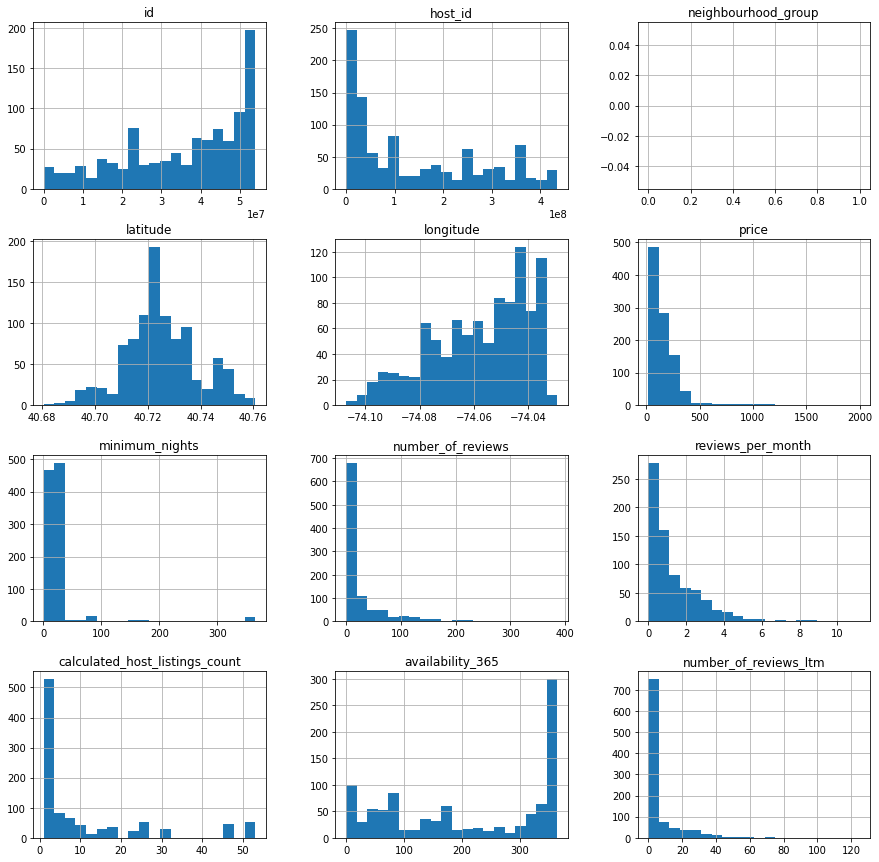

In [ ]:
df.hist(bins=20, figsize=(15,15));

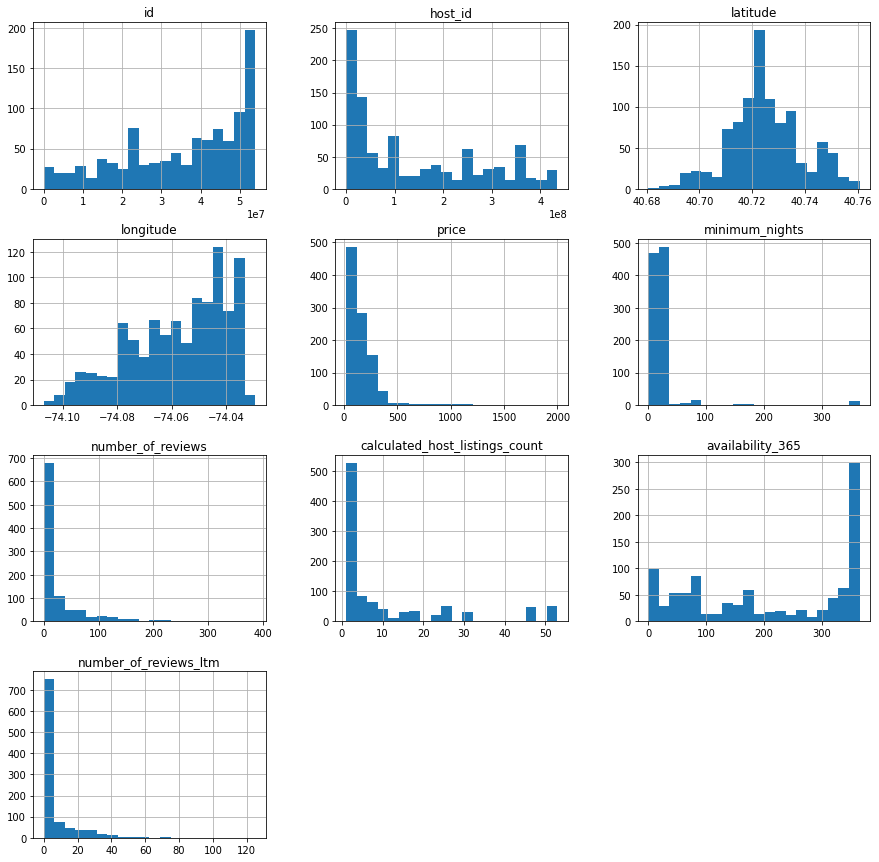

In [ ]:
# plotar o histograma das variáveis numéricas
df_clean.hist(bins=20, figsize=(15,15));

### **Q4. Qual a média dos preços de aluguel?**
Preço Médio de uma Diária em Jersey é de aproximadamente **159,50 USD**

In [ ]:
# ver a média da coluna `price``
df.price.mean()


159.47652347652348

### **Q4. Qual a correlação existente entre as variáveis**

In [ ]:
# criar uma matriz de correlação
corr = df_clean[['price', 'minimum_nights', 'number_of_reviews', 'number_of_reviews_ltm',
    'calculated_host_listings_count', 'availability_365']].corr()


# mostrar a matriz de correlação
display(corr)

,price,minimum_nights,number_of_reviews,number_of_reviews_ltm,calculated_host_listings_count,availability_365
price,1.000000,-0.048598,-0.118404,-0.042684,0.188050,0.151592
minimum_nights,-0.048598,1.000000,-0.120683,-0.201362,0.111573,0.173323
number_of_reviews,-0.118404,-0.120683,1.000000,0.611519,-0.191385,-0.026117
number_of_reviews_ltm,-0.042684,-0.201362,0.611519,1.000000,-0.216073,-0.078579
calculated_host_listings_count,0.188050,0.111573,-0.191385,-0.216073,1.000000,0.392929
availability_365,0.151592,0.173323,-0.026117,-0.078579,0.392929,1.000000


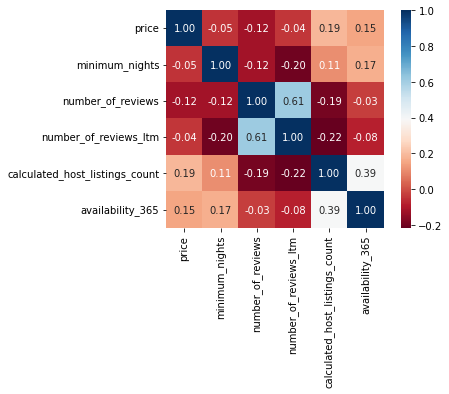

In [ ]:
# plotar um heatmap a partir das correlações
sns.heatmap(corr, cmap='RdBu', fmt='.2f', square=True, linecolor='white', annot=True);

### **Q5. Qual o tipo de imóvel mais alugado no Airbnb?**
Cerca de 68% dos imoveis que são alugados em Jersey são o Apartamento ou Casa inteira.
Isso pode ser um sinal de que quem busca esse tipo de acomodação na cidade, gosta de uma ambiente mais reservado e possivelmente estão dispostos a pagar por isso.

In [ ]:
# mostrar a quantidade de cada tipo de imóvel disponível
df.room_type.value_counts()

Entire home/apt    682
Private room       306
Hotel room          12
Shared room          1
Name: room_type, dtype: int64

In [ ]:
# mostrar a porcentagem de cada tipo de imóvel disponível
df.room_type.value_counts()/df.shape[0]

Entire home/apt    0.681319
Private room       0.305694
Hotel room         0.011988
Shared room        0.000999
Name: room_type, dtype: float64

### **Q6. Qual a localidade mais cara do dataset?**



A forma que o Dataset retrata Jersey é bem peculiar. Pode-se perceber que ele separar por WARD. E o que são Ward? É uma forma de se dividir a cidade por densidade populacional. Esses são represetandas por Letras A a D, ou número 1 a 6.
No caso o Ward E (Número 5) é o mais caro. O mótivo é a proximidade com a Ilha de Manhatan 

In [ ]:
# ver preços por bairros, na média
df_clean.groupby(['neighbourhood']).price.mean().sort_values(ascending=False)

neighbourhood
Ward E (councilmember James Solomon)           218.683333
Ward A (councilmember Denise Ridley)           142.591549
Ward B (councilmember Mira Prinz-Arey)         125.609756
Ward F (councilmember Jermaine D. Robinson)    125.298246
Ward C (councilmember Richard Boggiano)        123.254237
Ward D (councilmember Michael Yun)             123.171429
Name: price, dtype: float64

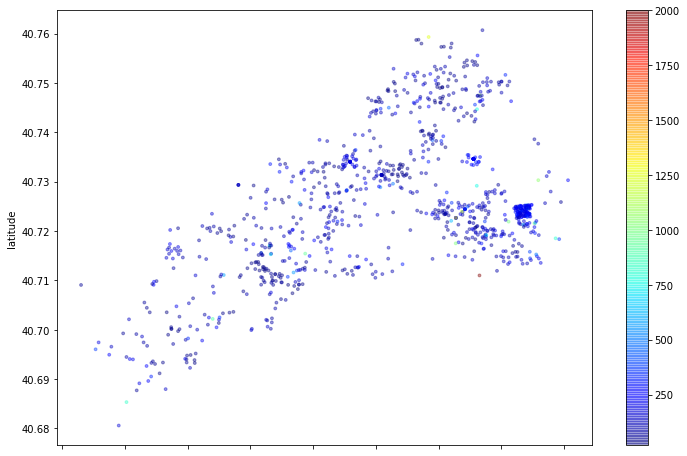

In [ ]:
# plotar os imóveis pela latitude-longitude
df_clean.plot(kind="scatter", x='longitude', y='latitude', alpha=0.4, c=df_clean['price'], s=8,
              cmap=plt.get_cmap('jet'), figsize=(12,8));

### **Q7. Qual é a média do mínimo de noites para aluguel (minimum_nights)?**

In [ ]:
# ver a média da coluna `minimum_nights``
df.minimum_nights.mean()

23.32867132867133

##Aqui está um overview dos dados do Airbnb de Jersey através da Pandas Profiling. Ferramenta que automatiza analises estatisticas e reune em um dashboard interativo e intuitivo.


In [ ]:
report = ProfileReport(df)

In [ ]:
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Conclusões


Neste projeto, conseguimos tirar algumas informações sobre o Airbnb na cidade de Jersey.
Foram excluído alguns outliers referente as informações de neighbourhood_group ,license, reviews_per_month e last_review  . Isso deu um pouco mais de luz ao DataFrame e se permitiu chegar a informações úteis como os tipos de imóveis com maior disponibilidade para aluguel e a média de preços entre os bairros de Jersey City, considerando o valor médio da diária até 159.50 USD.

Faz falta dados completos sobre reviews, já que com eles poderiamos explorar mais os sentimentos dos consumidores sobre o aluguel

A forma de separação territoral de Jersey, atráves de Wards, é um tanto quanto dificil de se cravar pela mesma depender do Censu Estatistico Americano.

Mas fora isso, como exploração prelimanares de dados, o resultado deu uma ideia de como o airbnb funciona na localidade 
 